# <p style="text-align:center" color="red"><span style="color:red">`Research Methodologies project`</span></p>
## <p style="text-align:center" color="red"><span style="color:green">ChemNLP: A Natural Language Processing based Library for Materials Chemistry Text Data
</span></p>
## <p style="text-align:center" color="red"><span style="color:red">Part 2 : Pattern Discovery: Dimensionality Reduction and Clustering in Cheminformatics</span></p>


**Membres du Groupe :**

- Abir Oumghar - `AMSD`
- Meryem Belkaid - `AMSD`
- Hafsa Boanani - `AMSD`


## Import the required libraries

In [27]:
# Suppress warnings for cleaner output
import warnings
warnings.filterwarnings('ignore')

# For data processing
import numpy as np
import pandas as pd

# For clustering and dimensionality reduction
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap.umap_ as umap
from scipy.spatial.distance import cdist

# Plotly imports
import plotly.graph_objects as go
from plotly.offline import plot

# For Parallel Computing
from joblib import Parallel, delayed

# For evaluation and visualization
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score, normalized_mutual_info_score
from tqdm import tqdm
import pickle


# Other imports 
from collections import Counter
from sklearn.metrics import confusion_matrix
import seaborn as sns; sns.set()  # for plot styling

## Load the pickle files containing the Embeddings

#### **Efficient Management of Large-Scale Embeddings via Segmentation Optimized Loading of Segmented Embeddings**

- The segmentation strategy described in the question is a common approach to handle large datasets that cannot fit into memory. The strategy involves dividing the dataset into smaller segments, processing each segment individually, and then combining the results. This approach allows for efficient processing and handling within the constraints of system memory and computational resources.

**Here is a step-by-step explanation of the procedure:**

- **`Dataset Segmentation:`** The dataset is divided into five segments. This segmentation ensures that each segment is manageable in terms of memory and computational resources.

- **`Serialization:`** Each segment of the dataset is serialized into a pickle file. Serialization is the process of converting an object's state to a byte stream. This allows the object to be stored and reused later. In this case, the serialized files are stored in the pickle format.

- **`Loading Dataset Segments:`** The load_dataset function is used to efficiently retrieve the stored embeddings from the serialized files. This function maps the file paths to their respective dataset segments.

- **`Processing Segments:`** Each segment of the dataset is loaded into its variable. This allows for efficient processing of the segment.

- **`Combining Results:`** The processed segments are combined to form a complete and integrated set of data embeddings. This combined set of embeddings is then used for dimensionality reduction and clustering.

This approach is particularly useful in chemical research, where the richness of data must be preserved through every step of the analytical process. By segmenting the dataset and processing each segment individually, the memory and computational resources constraints are mitigated. Additionally, this approach introduces flexibility and scalability to the workflow, allowing for easier adaptation to changes in the dataset or computational resources.

In [3]:
# Paths to the Embedding files
datasets_paths = {
    'cond_mat_embeddings_with_ids_5000':'cond_mat_embeddings_with_ids_5000.pickle',
    'cond_mat_embeddings_with_ids_10000':'cond_mat_embeddings_with_ids_10000.pickle',
    'cond_mat_embeddings_with_ids_16000': 'cond_mat_embeddings_with_ids_16000.pickle',
    'cond_mat_embeddings_with_ids_16001_21000': 'cond_mat_embeddings_with_ids_16001_21000.pickle',
    'cond_mat_embeddings_with_ids_21001_25000': 'cond_mat_embeddings_with_ids_21001_25000.pickle',
}

# Function to load a dataset
def load_dataset(file_path):       #Systematic Loading
    with open(file_path, 'rb') as file:
        return pickle.load(file)

# Load the datasets

cond_mat_embeddings_with_ids_5000 = load_dataset(datasets_paths["cond_mat_embeddings_with_ids_5000"])
cond_mat_embeddings_with_ids_10000 = load_dataset(datasets_paths["cond_mat_embeddings_with_ids_10000"])
cond_mat_embeddings_with_ids_16000 = load_dataset(datasets_paths["cond_mat_embeddings_with_ids_16000"])
cond_mat_embeddings_with_ids_16001_21000 = load_dataset(datasets_paths["cond_mat_embeddings_with_ids_16001_21000"])
cond_mat_embeddings_with_ids_21001_25000 = load_dataset(datasets_paths["cond_mat_embeddings_with_ids_21001_25000"])

## Analsye the Embeddings

### **Consolidation and Analysis of Chemical Embedding Dimensions**
- **`Merge Datasets:`** The merged_data_list is created by concatenating the 'data' lists from the five segmented datasets.

- **`Create Embeddings Data Dictionary:`** The embeddings_data dictionary is created with the merged_data_list assigned to the 'data' key. This data structure allows for easier handling of the merged dataset.

- **`Dataset Overview:`** The number of documents and features in the merged dataset is computed and printed.

This code snippet is a simplified version of the previously described code. However, it serves the same purpose of merging the segmented datasets and providing a summary of the merged dataset.

The output of the code snippet indicates that the merged dataset has 24996 documents and 768 features. This dimensional footprint of the embeddings corresponds to the encoded linguistic and semantic characteristics captured by the BERT model. The number of documents signifies the breadth of the dataset now prepared for downstream tasks such as clustering or predictive modeling.

The careful reassembly and analysis of the segmented embeddings ensure that we maintain the integrity and richness of the data as we progress towards more advanced stages of our study.

In [16]:
# Merge the datasets
merged_data_list = cond_mat_embeddings_with_ids_5000['data'] + cond_mat_embeddings_with_ids_10000['data'] + cond_mat_embeddings_with_ids_16000['data'] + cond_mat_embeddings_with_ids_16001_21000['data'] + cond_mat_embeddings_with_ids_21001_25000['data']  
embeddings_data = {'data': merged_data_list}

In [17]:
# Print dataset information
num_docs = len(embeddings_data['data'])
num_features = len(embeddings_data['data'][0]['embedding'])
print(f">> The Embedding Dataset has {num_docs} documents and {num_features} features.")

>> The Embedding Dataset has 24996 documents and 768 features.


## `Dimensionality Reduction` via PCA and `Clustering Analysis` with K-Means

### Comprehensive Evaluation of PCA and K-Means on Chemical Abstracts Embeddings

- The aim is to reduce the dimensionality of the chemical abstracts embeddings to facilitate clustering analysis and enhance interpretability.

- **PCA Implementation:** We deploy Principal Component Analysis (PCA) across a range of dimensions from 2 to 20 principal components n_components_list = [i for i in range(1, 15)] to identify the optimal feature subspace.

- **K-Means Clustering:** Utilizing the true number of clusters, informed by the number of unique labels, we apply `K-means clustering` to the reduced embeddings to categorize the documents into meaningful groups.

- **Evaluation Metrics:**

`Normalized Mutual Information (NMI):` Serving as an external validation measure, NMI provides a comparative analysis between our clustering results and the ground truth labels.

`Silhouette Score:` This metric guides the optimal choice of principal components by evaluating the cohesion and separation of the clusters formed at each level of dimensionality reduction.

**Results Visualization:**

We visualize the variance ratio explained by the principal components to understand the information retained post-reduction.

Evaluation metrics such as Silhouette and NMI scores are plotted against the number of principal components to discern the optimal dimensionality for clustering.

In [18]:
def evaluate_pca_kmeans_metrics(dataset_name, embeddings, labels, n_components_list):
    """
    Evaluate PCA and K-means clustering metrics.
    """
    results = {
        'n_components': [],
        'silhouette_score': [],
        'nmi_score': [],
        'explained_variance_ratio': []
    }
    n_clusters = len(set(labels))
    optimal_num_components = None
    max_silhouette_score = -1
    
    for n_components in tqdm(n_components_list, desc=f'Evaluating PCA components fo the {dataset_name} dataset'):
        # Apply PCA
        pca = PCA(n_components=n_components)
        reduced_data = pca.fit_transform(embeddings)
        # Record the percentage of Explained Variance Ratio by the chosen number of components 
        explained_variance_ratio = np.sum(pca.explained_variance_ratio_)
        
        # Apply K-means using the real number of clusters (the labels)
        kmeans = KMeans(n_clusters=n_clusters)
        predicted_labels = kmeans.fit_predict(reduced_data)

        # Calculate the Silhouette Score and the NMI Score
        silhouette_avg = silhouette_score(reduced_data, predicted_labels) 
        nmi = normalized_mutual_info_score(labels, predicted_labels) 

        # Store the results in a dictionary
        results['n_components'].append(n_components)
        results['silhouette_score'].append(silhouette_avg)
        results['nmi_score'].append(nmi)
        results['explained_variance_ratio'].append(explained_variance_ratio)
        
        # Update the optimal number of components based on the silhouette score
        if silhouette_avg > max_silhouette_score:
            max_silhouette_score = silhouette_avg
            optimal_num_components = n_components
    
    return pd.DataFrame(results)

def plot_evaluation_metrics(df_results, dataset_name):
    """
    Plot for evaluation metrics with vertical lines indicating optimal number of principal components.
    """
    # Create a figure with 1 subplot for Silhouette and NMI, and another for Explained Variance Ratio
    fig, (ax1, ax3) = plt.subplots(1, 2, figsize=(14, 7))

    # Subplot for Silhouette and NMI scores
    ax1.set_xlabel('Number of Principal Components')
    ax1.set_ylabel('Score', color='tab:blue')
    ax1.plot(df_results['n_components'], df_results['silhouette_score'], color='tab:blue', marker='o', label='Silhouette Score')
    ax1.plot(df_results['n_components'], df_results['nmi_score'], color='tab:red', marker='x', label='NMI Score')
    ax1.tick_params(axis='y', labelcolor='tab:blue')
    ax1.set_xticks(df_results['n_components'])
    ax1.legend(loc='upper left')
    ax1.grid(True)

    # Add vertical lines for optimal number of components based on Silhouette and NMI scores
    optimal_n_components_silhouette = df_results.loc[df_results['silhouette_score'].idxmax(), 'n_components']
    ax1.axvline(x=optimal_n_components_silhouette, color='tab:green', linestyle='--', label=f'Optimal PCs (Silhouette): {optimal_n_components_silhouette}', alpha=0.7)
    optimal_n_nmi_score = df_results.loc[df_results['nmi_score'].idxmax(), 'n_components']
    ax1.axvline(x=optimal_n_nmi_score, color='tab:orange', linestyle='--', label=f'Optimal PCs (NMI): {optimal_n_nmi_score}', alpha=0.7)

    # Subplot for Explained Variance Ratio
    ax3.set_xlabel('Number of Principal Components')
    ax3.set_ylabel('Explained Variance Ratio', color='tab:green')
    ax3.plot(df_results['n_components'], df_results['explained_variance_ratio'], color='tab:green', marker='^', label='Explained Variance Ratio')
    ax3.tick_params(axis='y', labelcolor='tab:green')
    ax3.set_xticks(df_results['n_components'])  # Ensure x-ticks correspond to the number of components tested
    ax3.legend(loc='upper left')
    ax3.grid(True)

    # Add lines to the legend
    ax1.legend(loc='upper left', bbox_to_anchor=(1, 1), title='Legend', title_fontsize='large')
    plt.suptitle(f'Evaluation Metrics across Principal Components - {dataset_name}')
    fig.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to make room for the title
    plt.show()

### Refinement and Assessment of Chemical Abstracts Embeddings via PCA
#### Embedding Extraction and PCA Evaluation Process

##### Procedure Steps:

- **Data Extraction:** The embeddings and labels are first extracted from the embeddings_data dictionary, which houses the data in a structured format.

- **Array Conversion:** The list of embeddings is then converted into a NumPy array, a format suitable for mathematical manipulation and input into machine learning algorithms.

Principal Components Testing: We iterate over a range of principal components, from 1 to 14, to assess the impact of dimensionality reduction on clustering performance.

##### Graphical Analysis and Metrics Interpretation:

The accompanying plots illustrate how varying numbers of principal components affect the clustering metrics, such as Silhouette Score and Normalized Mutual Information (NMI), alongside the explained variance ratio.

The Silhouette Score is depicted in blue, providing insights into the compactness and separation of clusters, with higher scores indicating better-defined clusters.

**`The NMI Score`**, shown in red, measures the clustering outcome's alignment with the true class labels, with higher values suggesting greater accuracy.

**`The Explained Variance Ratio`**, represented in green, indicates the proportion of dataset variance captured by each principal component count.

Selection of Optimal Principal Components:

**`Silhouette Score:`** Indicates that a lower number of principal components may lead to well-separated and distinct clusters.

**`NMI Score:`** Suggests the number of components that achieve clustering most aligned with the true labels.

**Decision Criterion:** The optimal number of principal components is chosen based on a balance between the Silhouette Score and the NMI, ensuring both well-defined cluster structures and alignment with true classifications.

- **Conclusion:**

The analysis provides a clear visual and quantitative guide to selecting the best number of principal components for clustering. It underscores the importance of dimensionality reduction in preparing high-dimensional embedding data for meaningful clustering, facilitating a deeper understanding of the dataset's inherent structure.

In [19]:
# Extract embeddings and labels from the embeddings_data dictionary
embeddings_list = [item['embedding'] for item in embeddings_data['data']]  
labels = [item['label'] for item in embeddings_data['data']]

# Convert the embeddings list to a NumPy array
embeddings = np.array(embeddings_list)

# Define the dataset name
dataset_name = 'Cond Mat'

Evaluating PCA components fo the Cond Mat dataset: 100%|█| 14/14 [03:09<


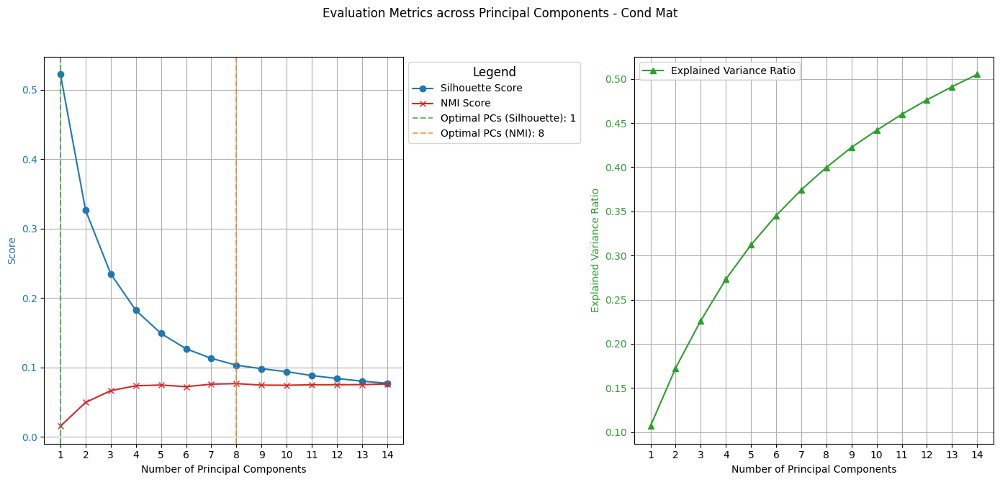

In [20]:
# List of Principal Components to test
n_components_list = [i for i in range(1, 15)]
df_results = evaluate_pca_kmeans_metrics(dataset_name, embeddings, labels, n_components_list)
plot_evaluation_metrics(df_results, dataset_name)

#### Optimal Number of Principal Components Interpretation

- **Silhouette Score**: Higher scores indicate that the clusters are well-separated and distinct.
- **NMI Score**: Higher scores suggest clustering that aligns closely with the true labels.

**Selection Criteria**:
Opt for the number of components that optimally balance both metrics.

The analysis reveals the trade-offs between dimensionality reduction and clustering quality. The optimal number of principal components is determined based on the silhouette score, which highlights the best-defined cluster structure. Additionally, the NMI score complements this by indicating the level of agreement between the clustering assignments and the true classifications.

The concluding remarks suggest that the combination of PCA and K-Means clustering effectively transforms the high-dimensional embeddings space into a more manageable format, while preserving key patterns and relationships. This step is crucial in the analytical pipeline, as it directly impacts the clarity and usefulness of the clustering results. Clearer clustering allows for more accurate interpretations and conclusions in the later analysis of the chemical documents dataset.

In summary, the analysis and conclusions highlight the importance of dimensionality reduction and clustering in the chemical documents dataset, enabling a more accessible and interpretable embeddings space.able

## t-SNE for `Dimensionality Reduction` and K-means for `Clusting`


In this step, we'll utilize **t-distributed Stochastic Neighbor Embedding (t-SNE)** to reduce the dimensionality of the datasets. We'll explore various values of **perplexity** and evaluate their impact. Perplexity directly influences cluster formation, thus selecting the optimal perplexity is crucial. To achieve this, we will experiment with different values and assess the performance using metrics such as **Normalized Mutual Information (NMI)** and **Silhouette score** plotted against perplexity. Additionally, we will visualize the resulting **2D clustering graph of the best t-SNE configuration found**.

In [21]:
# Perplexity values to test for t-SNE
perplexities = [i for i in range(1, 10)]

Applying t-SNE on Cond Mat: 100%|██████| 9/9 [1:49:59<00:00, 733.30s/it]


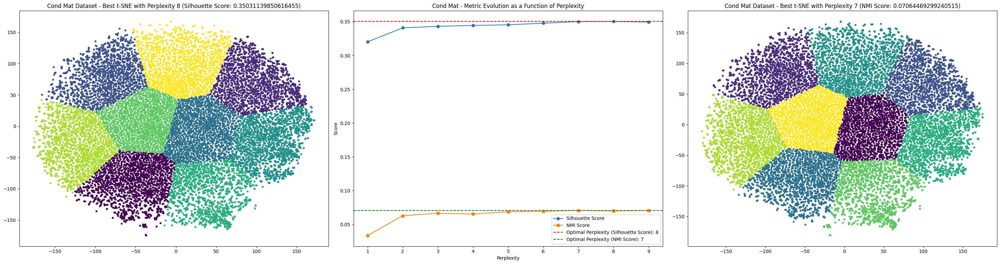

In [22]:
# Dictionary to store the scores for the dataset
dataset_scores = {}

# Dictionary to store t-SNE results and K-means labels for the dataset
tsne_results_list = {}
kmeans_labels_list = {}

# Extract embeddings and labels from the embeddings_data dictionary
embeddings_list = [item['embedding'] for item in embeddings_data['data']]
labels = [item['label'] for item in embeddings_data['data']]
embeddings = np.array(embeddings_list)
name = 'Cond Mat'

# Initialize the scores dictionary
dataset_scores[name] = {'perplexity': [], 'silhouette_score': [], 'nmi_score': []}

# Initialize lists to store t-SNE results and K-means labels for each perplexity
tsne_results_list[name] = []
kmeans_labels_list[name] = []

best_silhouette_score = -1
best_perplexity = None
best_tsne_result = None
best_clustered_labels = None

# tqdm is used here for a progress bar
for perplexity in tqdm(perplexities, desc=f'Applying t-SNE on {name}'):
    # Apply t-SNE
    tsne = TSNE(n_components=2, perplexity=perplexity, n_iter=3000, random_state=42)
    tsne_results = tsne.fit_transform(embeddings)
    tsne_results_list[name].append(tsne_results)  # Store t-SNE results
    
    # Perform K-means clustering on the t-SNE results
    kmeans = KMeans(n_clusters=len(set(labels)), random_state=42) # Apply K-means with the real label number
    kmeans.fit(tsne_results)
    clustered_labels = kmeans.labels_
    kmeans_labels_list[name].append(clustered_labels)  # Store K-means labels
    
    # Calculate metrics: NMI and Silhouette
    silhouette_avg = silhouette_score(tsne_results, clustered_labels)
    nmi = normalized_mutual_info_score(labels, clustered_labels)
    
    # Update the best scores and results
    if silhouette_avg > best_silhouette_score:
        best_silhouette_score = silhouette_avg
        best_perplexity = perplexity
        best_tsne_result = tsne_results
        best_clustered_labels = clustered_labels
    
    # Store the metrics
    dataset_scores[name]['perplexity'].append(perplexity)
    dataset_scores[name]['silhouette_score'].append(silhouette_avg)
    dataset_scores[name]['nmi_score'].append(nmi)
        
# Create a figure with three subplots arranged horizontally
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30, 8))
    
# First subplot for the best t-SNE results based on silhouette score
ax1.scatter(best_tsne_result[:, 0], best_tsne_result[:, 1], c=best_clustered_labels, cmap='viridis', marker='.')
ax1.set_title(f'{name} Dataset - Best t-SNE with Perplexity {best_perplexity} (Silhouette Score: {best_silhouette_score})')

# Second subplot for the metric evolution based on perplexity
ax2.plot(dataset_scores[name]['perplexity'], dataset_scores[name]['silhouette_score'], 'o-', label='Silhouette Score')
ax2.plot(dataset_scores[name]['perplexity'], dataset_scores[name]['nmi_score'], 's-', label='NMI Score')
ax2.set_xlabel('Perplexity')
ax2.set_ylabel('Score')
ax2.set_title(f'{name} - Metric Evolution as a Function of Perplexity')
ax2.legend()

# Add horizontal lines for the optimal perplexities based on the Silhouette and NMI Scores
best_silhouette_index = np.argmax(dataset_scores[name]['silhouette_score'])
optimal_perplexity_silhouette_score = dataset_scores[name]['perplexity'][best_silhouette_index]
ax2.axhline(y=max(dataset_scores[name]['silhouette_score']), color='r', linestyle='--', label=f'Optimal Perplexity (Silhouette Score): {optimal_perplexity_silhouette_score}')

best_nmi_index = np.argmax(dataset_scores[name]['nmi_score'])
optimal_perplexity_nmi_score = dataset_scores[name]['perplexity'][best_nmi_index]
ax2.axhline(y=max(dataset_scores[name]['nmi_score']), color='g', linestyle='--', label=f'Optimal Perplexity (NMI Score): {optimal_perplexity_nmi_score}')
ax2.legend()

# Third subplot for the best t-SNE results based on NMI score
ax3.scatter(tsne_results_list[name][best_nmi_index][:, 0], tsne_results_list[name][best_nmi_index][:, 1], c=kmeans_labels_list[name][best_nmi_index], cmap='viridis', marker='.')
ax3.set_title(f'{name} Dataset - Best t-SNE with Perplexity {optimal_perplexity_nmi_score} (NMI Score: {max(dataset_scores[name]["nmi_score"])})')

plt.tight_layout()
plt.show()

### Visualize Clusters Using Optimal Parameters for PCA, UMAP and t-SNE

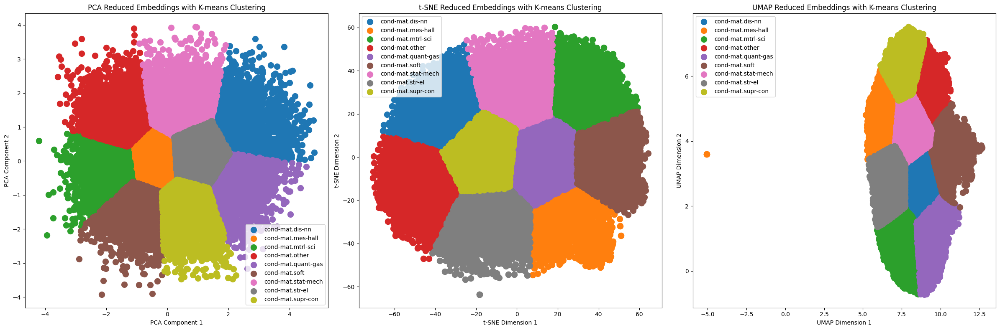

In [23]:
embeddings_list = [item['embedding'] for item in embeddings_data['data']]
labels = [item['label'] for item in embeddings_data['data']]
embeddings = np.array(embeddings_list)

# Unique labels and their mapping to integers for visualization
unique_labels = np.unique(labels)
label_to_int = {label: i for i, label in enumerate(unique_labels)}
int_to_label = {i: label for label, i in label_to_int.items()}
label_colors = [label_to_int[label] for label in labels]

# Initialize PCA, t-SNE, and UMAP with 2 components each
pca = PCA(n_components=2, random_state=42)
tsne = TSNE(n_components=2, random_state=42, verbose=0)
umap_reducer = umap.UMAP(n_components=2, random_state=42)

# Apply dimensionality reduction
reduced_embeddings_pca = pca.fit_transform(embeddings)
reduced_embeddings_tsne = tsne.fit_transform(embeddings)
reduced_embeddings_umap = umap_reducer.fit_transform(embeddings)

# Number of unique clusters/classes
n_clusters = len(unique_labels)

# Apply K-means clustering for each reduced data
kmeans_pca = KMeans(n_clusters=n_clusters, random_state=42).fit(reduced_embeddings_pca)
kmeans_tsne = KMeans(n_clusters=n_clusters, random_state=42).fit(reduced_embeddings_tsne)
kmeans_umap = KMeans(n_clusters=n_clusters, random_state=42).fit(reduced_embeddings_umap)

# Creating subplots
fig, axs = plt.subplots(1, 3, figsize=(24, 8))

# Define a scatter plot function
def scatter_plot(ax, reduced_embeddings, title, x_label, y_label, clusters):
    for i, label in int_to_label.items():
        ax.scatter(reduced_embeddings[clusters == i, 0], reduced_embeddings[clusters == i, 1], label=label, s=100)
    ax.set_title(title)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot each method's result
scatter_plot(axs[0], reduced_embeddings_pca, 'PCA Reduced Embeddings with K-means Clustering', 'PCA Component 1', 'PCA Component 2', kmeans_pca.labels_)
scatter_plot(axs[1], reduced_embeddings_tsne, 't-SNE Reduced Embeddings with K-means Clustering', 't-SNE Dimension 1', 't-SNE Dimension 2', kmeans_tsne.labels_)
scatter_plot(axs[2], reduced_embeddings_umap, 'UMAP Reduced Embeddings with K-means Clustering', 'UMAP Dimension 1', 'UMAP Dimension 2', kmeans_umap.labels_)

plt.tight_layout()
plt.show()

### 2D PCA Reduced Embeddings with K-means Clustering

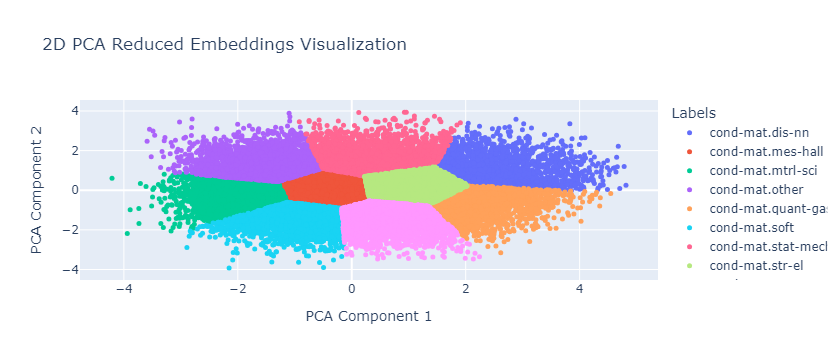

In [24]:
embeddings_list = [item['embedding'] for item in embeddings_data['data']]
labels = [item['label'] for item in embeddings_data['data']]
embeddings = np.array(embeddings_list)

# Unique labels and their mapping to integers for visualization
unique_labels = np.unique(labels)
label_to_int = {label: i for i, label in enumerate(unique_labels)}
int_to_label = {i: label for label, i in label_to_int.items()}
label_colors = [label_to_int[label] for label in labels]

# Apply PCA with 2 components for 2D visualization
pca = PCA(n_components=2, random_state=42)
reduced_embeddings_pca = pca.fit_transform(embeddings)

# Apply K-means clustering for each reduced data
kmeans_pca = KMeans(n_clusters=n_clusters, random_state=42).fit(reduced_embeddings_pca)

# Plotting in 2D
fig = go.Figure()

# Add traces for each unique label
for i, label in int_to_label.items():
    indices = np.where(kmeans_pca.labels_ == i)[0]
    fig.add_trace(go.Scatter(
        x=reduced_embeddings_pca[indices, 0],
        y=reduced_embeddings_pca[indices, 1],
        mode='markers',
        name=label,
        marker=dict(size=5),
        text=[f"Label: {label}" for _ in indices]  # Hover text
    ))

# Update layout for a better look in 2D
fig.update_layout(
    title='2D PCA Reduced Embeddings Visualization',
    xaxis_title='PCA Component 1',
    yaxis_title='PCA Component 2',
    legend_title='Labels'
)

# Save the figure in the working directory
plotly_filename = "2D PCA Reduced Embeddings Visualization.html"
plot(fig, filename=plotly_filename)

# Show the figure
fig.show()

### 3D PCA Reduced Embeddings with K-means Clustering

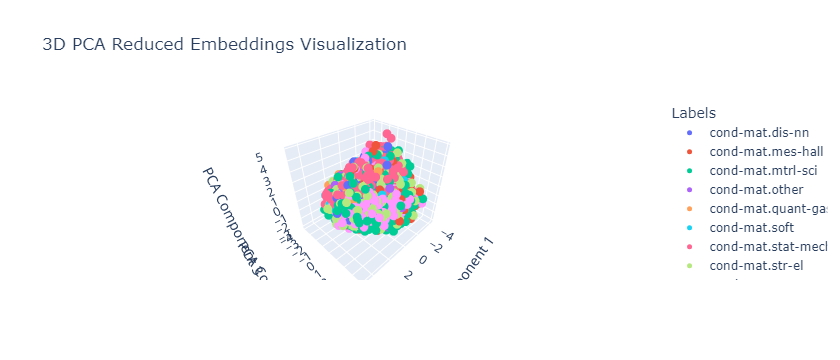

In [25]:
# Assuming embeddings_data is already defined and contains your embeddings and labels
embeddings_list = [item['embedding'] for item in embeddings_data['data']]
labels = [item['label'] for item in embeddings_data['data']]
embeddings = np.array(embeddings_list)

# Unique labels and their mapping to integers for visualization
unique_labels = np.unique(labels)
label_to_int = {label: i for i, label in enumerate(unique_labels)}
int_to_label = {i: label for label, i in label_to_int.items()}
label_colors = [label_to_int[label] for label in labels]

# Apply PCA with 3 components
pca = PCA(n_components=3, random_state=42)
reduced_embeddings_pca = pca.fit_transform(embeddings)

# Plotting
fig = go.Figure()

# Add traces for each unique label
for i, label in int_to_label.items():
    indices = [j for j, x in enumerate(labels) if x == label]
    fig.add_trace(go.Scatter3d(
        x=reduced_embeddings_pca[indices, 0],
        y=reduced_embeddings_pca[indices, 1],
        z=reduced_embeddings_pca[indices, 2],
        mode='markers',
        name=label,
        marker=dict(size=5),
        text=[f"Label: {label}" for _ in indices]  # Hover text
    ))

# Update layout for a better look in 3D
fig.update_layout(
    title='3D PCA Reduced Embeddings Visualization',
    scene=dict(
        xaxis_title='PCA Component 1',
        yaxis_title='PCA Component 2',
        zaxis_title='PCA Component 3'
    ),
    legend_title='Labels'
)

# Save the figure in the working directory
plotly_filename = "3D PCA Reduced Embeddings with K-means Clustering.html"
plot(fig, filename=plotly_filename)

# Show the figure
fig.show()

- We can notive that The 2D visualizations provide a clearer and more interpretable view of the clusters compared to the 3D visualization, where the overlapping of points can obscure the distinctions between groups.

#### **Conclusion :**

     In conclusion, this project stands as a testament to the transformative power of machine learning in scientific research. It highlights the capabilities of advanced algorithms not only to process and analyze data but also to enhance our understanding of complex fields. Through the strategic use of BERT embeddings and dimensionality reduction techniques like PCA, t-SNE, and UMAP, followed by K-means clustering, our analysis has uncovered distinct clusters that likely correspond to various sub-disciplines within condensed matter physics.

     The clustering results, assessed using metrics such as the silhouette score and normalized mutual information, show a strong alignment between the unsupervised groupings and the inherent categorizations of the subjects. This suggests that our methodology is not only valid but also adept at discerning the subtle nuances within complex scientific literature.

    Furthermore, the project has demonstrated the scalability of machine learning workflows. By segmenting the dataset and managing partitions, we efficiently handled large volumes of data, ensuring both the integrity of our embeddings and the feasibility of our computational approach.